In [1]:
import boto3
import json
import base64
from io import BytesIO
from IPython.display import Image, display

In [2]:
# Initialize the Amazon Bedrock client
bedrock = boto3.client('bedrock-runtime')

In [3]:
def get_stylist_recommendation(occasion, gender):
    # Step 1: Text-based outfit suggestion from Claude model
    prompt_text = f"Human: I am attending a {occasion} and I am {gender}. What outfit would you suggest?\nAssistant:"

    # Define the payload for invoking the model
    payload = {
        "prompt": prompt_text,             
        "max_tokens_to_sample": 200        
    }
    
    # Call Claude model for text-based recommendation
    suggestion_response = bedrock.invoke_model(
        modelId='anthropic.claude-v2:1',
        contentType='application/json',
        body=json.dumps(payload).encode('utf-8')
    )

    # Extract the outfit suggestion text
    suggestion = suggestion_response['body'].read().decode('utf-8')
    
    # Step 2: Split the text-based suggestion into relevant parts (e.g., sentences or clothing items)
    # Assuming the suggestion is a multi-part text, you can split it by punctuation or predefined rules
    suggestion_parts = suggestion.split('. ')  # Simple split by sentences (adjust as needed)

    # Prepare a list to store the final text-image pairs
    matched_suggestions = []

    for part in suggestion_parts:
        if part.strip():  # Ensure the part is not empty
            # Step 3: For each text part, generate an image
            prompt_image = f"An outfit that matches the following description: {part}."

            stable_diffusion_payload = {
                "text_prompts": [{"text": prompt_image}],
                "cfg_scale": 7,
                "steps": 50,
                "seed": 0
            }

            try:
                # Call Stable Diffusion for each image generation
                image_response = bedrock.invoke_model(
                    modelId='stability.stable-diffusion-xl-v1',
                    contentType='application/json',
                    body=json.dumps(stable_diffusion_payload)
                )
                
                image_result = json.loads(image_response['body'].read())
                
                # Extract the base64 encoded image
                image_suggestions = image_result['artifacts'][0]['base64']

                # Add padding if necessary
                image_suggestions += '=' * (-len(image_suggestions) % 4)

            except Exception as e:
                print(f"Error generating image for part '{part}': {str(e)}")
                image_suggestions = None
            
            # Store the text suggestion part and its corresponding image in a list
            matched_suggestions.append({
                'text_part': part,
                'image_suggestion': image_suggestions
            })

    # Return the matched text and images
    return matched_suggestions


What is the occasion? (e.g., wedding, casual outing, formal event):  Christmas party
What is your gender? (e.g., male, female, non-binary):  female


Text Suggestion: {"type":"completion","completion":" Here are some suggested Christmas party outfits for a female:\n\n- A festive holiday dress - Look for one in velvet, lace, or with sparkly accents


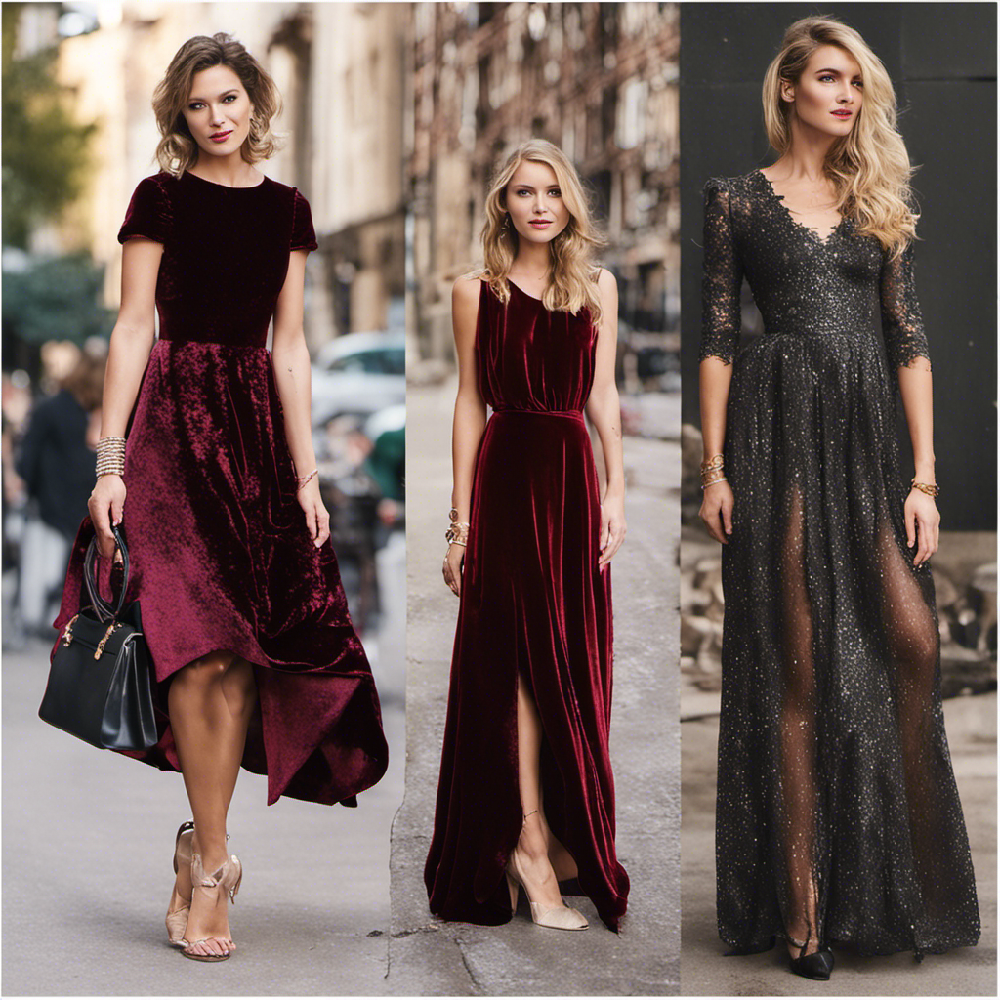

Text Suggestion: A knee-length dress in red, green or a jewel-tone works well


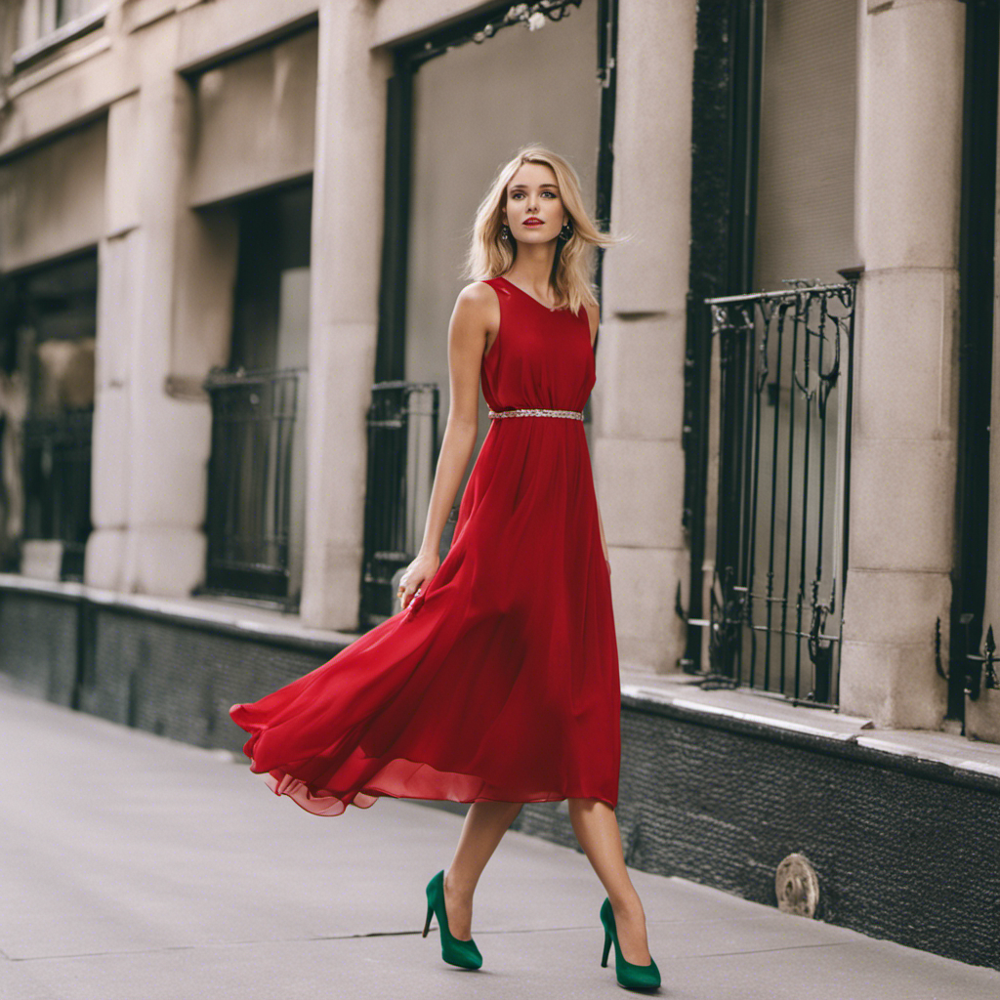

Text Suggestion: Pair it with heels or booties.\n\n- A skirt with a festive top - Try a sequin or glittery tank or blouse paired with a skirt in a fun holiday color or print


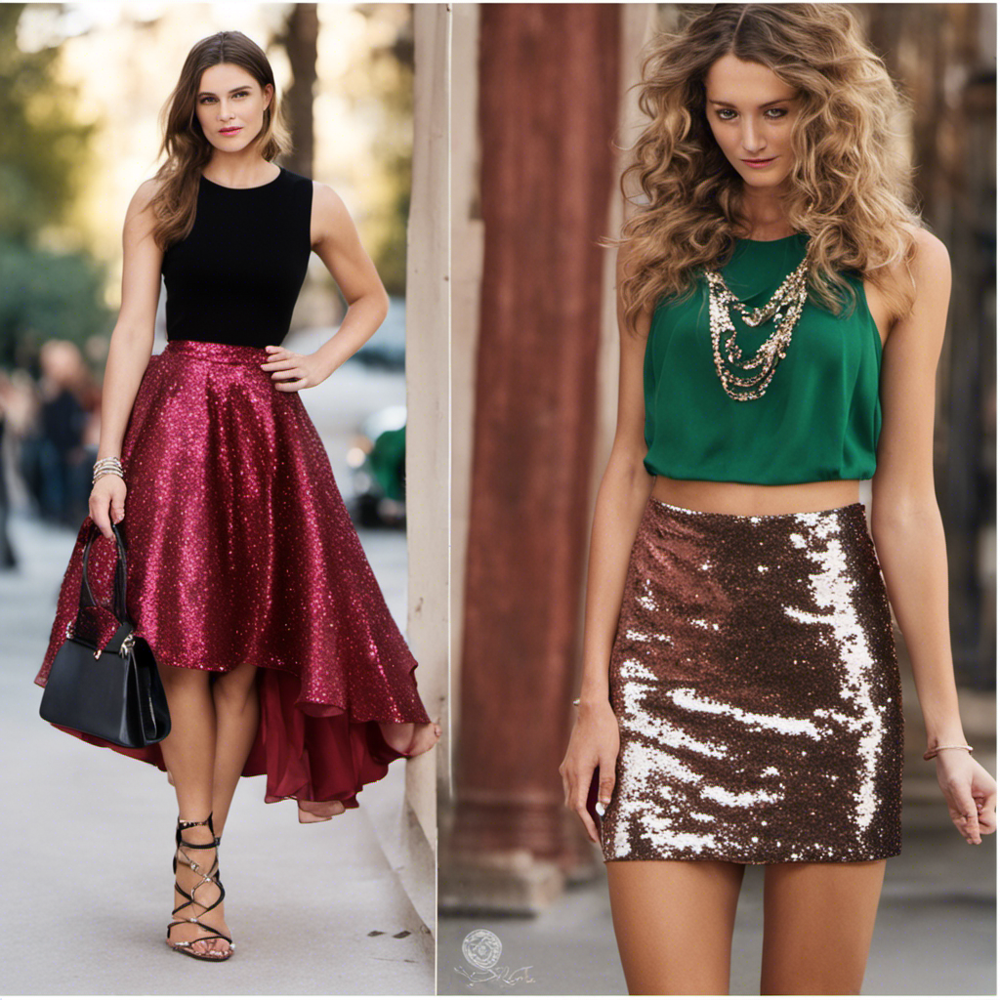

Text Suggestion: Finish the look with festive jewelry.\n\n- Dressy pants and a nice top - Opt for stylish pants in a dark color like burgundy, forest green, or black paired with a silky camisole or blouse


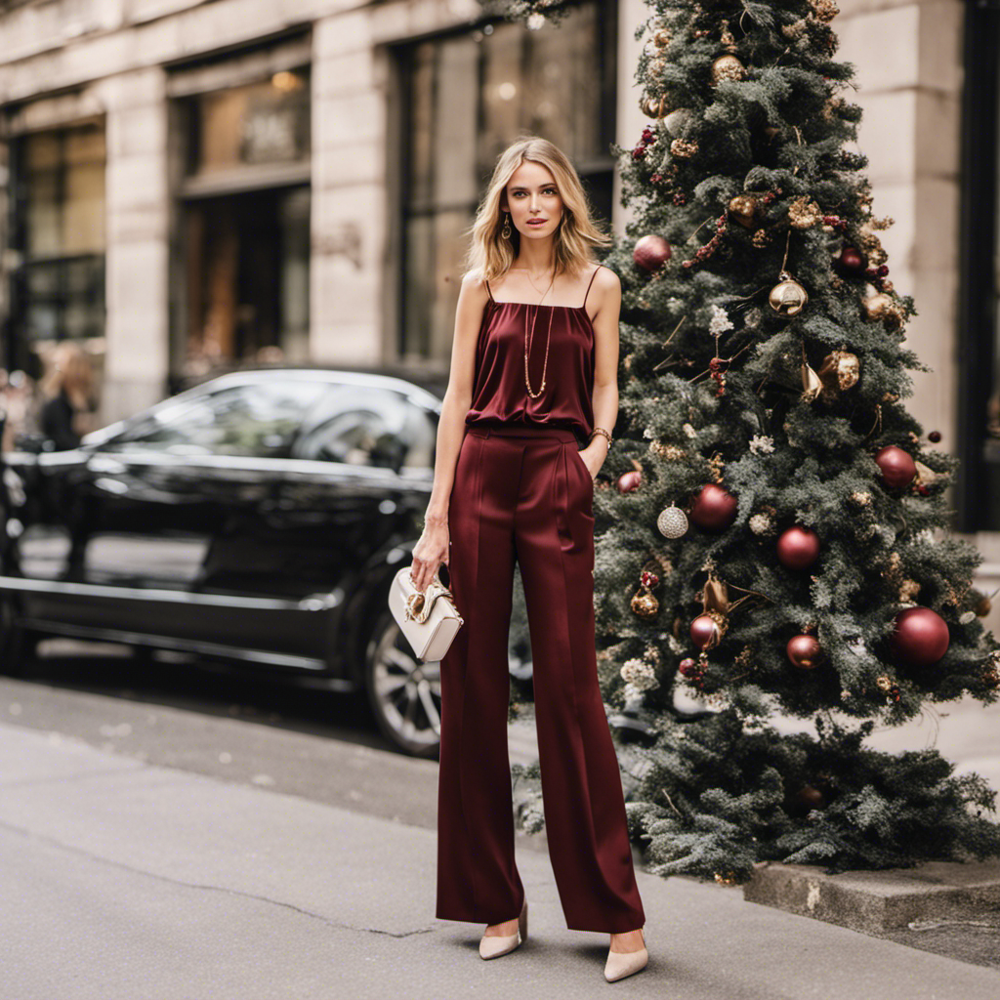

Text Suggestion: Add some metallic heels or pumps to dress it up.\n\n- A jumpsuit or romper - A holiday-inspired lace, velvet or jewel-tone jumpsuit or romper can be dressed up with heels and dressed down with booties.\n\n-","stop_reason":"max_tokens","stop":null}


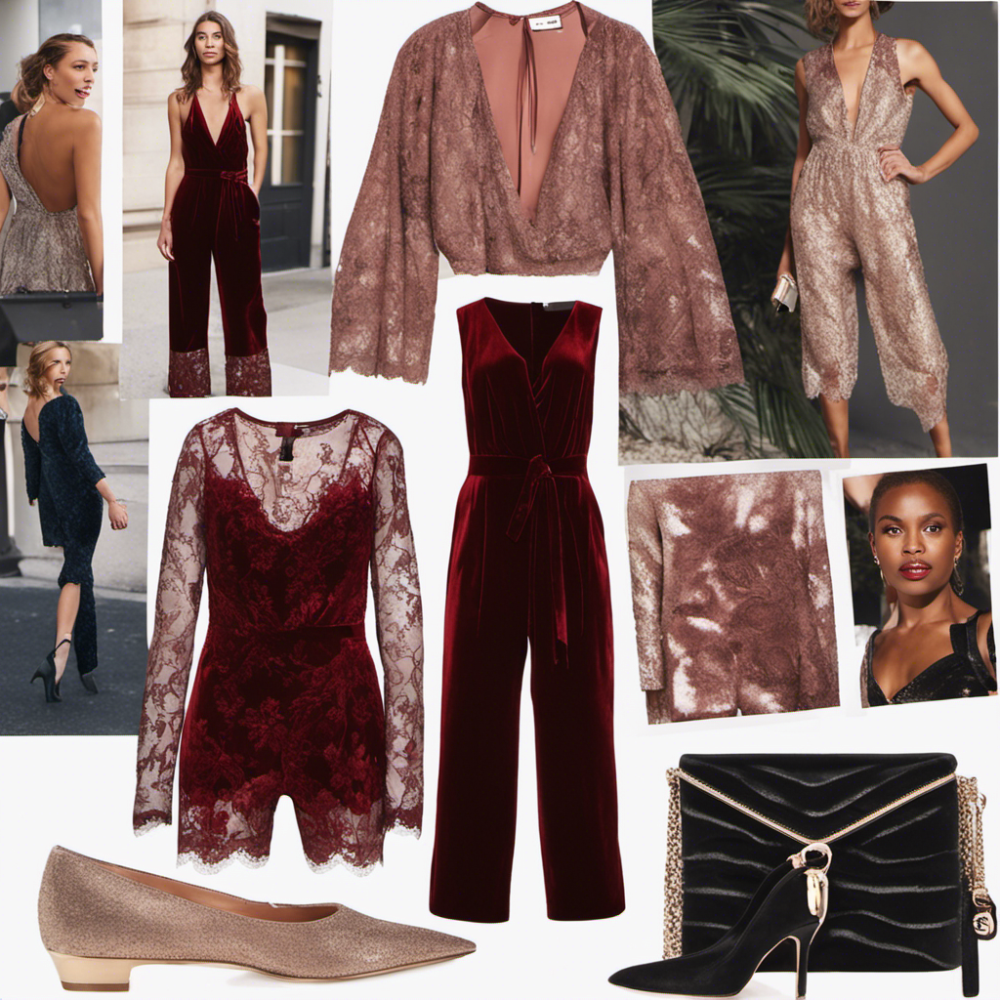

In [5]:
# Example usage
if __name__ == "__main__":
    # Collect input from the user
    occasion = input("What is the occasion? (e.g., wedding, casual outing, formal event): ")
    gender = input("What is your gender? (e.g., male, female, non-binary): ")

    # Generate and display the style suggestions
    stylist_results = get_stylist_recommendation(occasion, gender)

    # Output the final recommendations
    for result in stylist_results:
        print("Text Suggestion:", result['text_part'])
        # Display the image if available
        if result['image_suggestion']:
            try:
                image_data = base64.b64decode(result['image_suggestion'])
                image = Image(data=image_data)
                display(image)
            except Exception as e:
                print(f"Error displaying image: {str(e)}")
        else:
            print("No image generated for this suggestion.")